$ \huge Parte \ I: ResNet-50 $

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Actividad 1:**

La utilidad de una capa convolucional con kernel $1 \times 1$  con $F$ filtros es que le asigna a un píxel de entrada con $C$ canales un píxel de salida pero ahora con $F$ canales. Es decir, pasamos de tener $C$ canales a $F$ canales. De esta forma, la utilidad de esta capa es cambiar el numero de canales de profundidad al valor que nosotros queramos. Y la razón por la que uno querría cambiar el número de canales de una imagen, (más en especifico disminuir esa cantidad), es porque al reducir el número de canales de profundidad se hace más rápida la multiplicación de estas imagenes, es decir, reducimos costos.

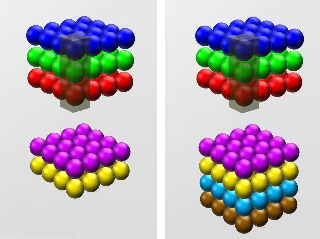

$\underline{Comentario:}$ En la imagen presentada se puede observar más claramente como un filtro de 1x1 puede cambiar el numero de canales de un pixel, ya sea aumentandolos o disminuyendolos. Sin embargo, lo que nosotros buscamos es disminuirlos para así reducir costos. 

# **Actividad 2:**

Los bloques residuales consisten en sumar a capas posteriores, capas anteriores (como se ve en la imagen presentada). Por ejemplo, estamos al principio de una capa con el tensor $x$, luego pasamos por dos capas obteniendo $ \mathcal{F}(x)$ y al final de la segunda capa calculamos y decimos que nuestro output es $ \mathcal{F}(x) + x $ en vez de $ \mathcal{F}(x) $. La utilidad de estos bloques es que para realizar backprogation ya no tendremos problemas con "vanishing gradients" ya que estamos sumando la identidad a la capa $(x)$ y así evitamos que los gradientes se anulen o se hagan muy cercanos a 0. Todo esto provoca que haya una eficacia residual y por ende de aprendizaje.

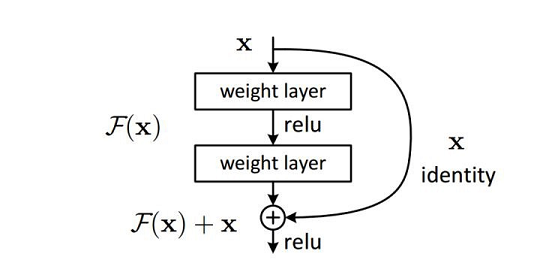

# **Actividad 3:**

Partiremos escribiendo el codigo que nos brindan por enunciado

In [ ]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, Activation, Input, Add, AveragePooling2D, Softmax, GlobalAveragePooling2D

In [ ]:
x = Input(shape = (224, 224, 3))
x = Conv2D(64, (7,7), strides = (2,2), name = "conv1", padding = 'same')(x)
x = BatchNormalization(name="bn_conv1")(x)
x = Activation("relu")(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding = 'same')(x)

Ahora realizaremos la completación de la función que crea 1 bloque residual. Pero agregaremos que nos pide como input el stride para que así sirva esta función para cualquiera de los "Stages" 1, 2, 3 y 4. 

In [ ]:
def identity_block(input, filters, block, stage, s):

  name = "block_{}_stage_{}".format(block, stage)

  # Aquí imprimimos el nombre el cual indica el block y stage

  print("\n")
  print("Nombre: ", name)
  print("\n")

  f1, f2, f3 = filters

  x=input

  x = Conv2D(f1, (1, 1), strides = (s,s))(x)       # Aplicamos el stride correspondiente que para el stage 1 es s=1
  x = BatchNormalization(name = "bn1_" + name)(x)
  x = Activation("relu")(x)

  x = Conv2D(f2, (3, 3), padding = 'same')(x)
  x = BatchNormalization(name = "bn2_" + name)(x)
  x = Activation("relu")(x)

  x = Conv2D(f3, (1, 1))(x)
  x = BatchNormalization(name = "bn3_" + name)(x)

  if input.shape != x.shape:  # Que solo sucede en el bloque 1
    # Para que calcen la dimensiones tenemos que sumar dos elementos de dimensionalidad 3 i.e. (n_1, n_2, n_3)
    # Para que calcen los n_1 y n_2 aplicaremos al input un filtro de 1x1 el stride correspondiente de esta 
    # manera el bloque convolucional y el input tendran los mismos n_1 y n_2
    # Ahora para que calcen los n_3 debemos aplicar f3 filtros, es decir que todo se resume a:
    # Una aplicacion de f3 filtros de kernel's 1x1 con stride 's'.
    # De esta forma, los n_1, n_2 y n_3 tanto de x como de Input calzan y se pueden sumar. 

    input = Conv2D(f3, (1,1), strides=(s,s))(input)

  # Se suman ahora Input y el x pues tienen la misma dimensionalidad
  x = Add()([x, input])
  x = Activation("relu")(x)

  print("Dimensiones del tensor resultante:", x.shape)

  print("--------------------")

  return x

Para la primera etapa de bloques residuales debemos imprimir indicaremos la dimensión del tensor resultante.

In [ ]:
# STAGE 1

# identity_block(input, filters, block, stage, s)

x = identity_block(x, [64,64,256], 1, 1, 1)
x = identity_block(x, [64,64,256], 2, 1, 1)
x = identity_block(x, [64,64,256], 3, 1, 1)



Nombre:  block_1_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_2_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_3_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


$ \underline{Dimensiones \ \ del \ \ tensor \ \ resultante}: $

***Primera Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(56, 56, 256)$.

# **Actividad 4:**

Para mayor simplicidad, vamos a crear una función que reciba como input el stage y que ahí genere todos los bloques residuales correspondientes al stage indicado.

In [ ]:
def etapa(input, n):

  bloq_resi_stage = {1: 3, 2: 4, 3: 6, 4: 3}
  strides_stage = {1: 1, 2: 2, 3: 2, 4: 2}

  x = input

  for i in range(bloq_resi_stage[n]):
    if i == 0:
      x = identity_block(x, [64*(2**(n-1)),64*(2**(n-1)),256*(2**(n-1))], i+1, n, strides_stage[n])
    else:
      x = identity_block(x, [64*(2**(n-1)),64*(2**(n-1)),256*(2**(n-1))], i+1, n, 1)
  
  return x

In [ ]:
x = Input(shape = (224, 224, 3))
x = Conv2D(64, (7,7), strides = (2,2), name = "conv1", padding = 'same')(x)
x = BatchNormalization(name="bn_conv1")(x)
x = Activation("relu")(x)
x = MaxPooling2D((3, 3), strides=(2, 2), padding = 'same')(x)

In [ ]:
print("STAGE 1:")
print("\n")

x = etapa(x, 1)

print("--------------------")
print("--------------------")
print("--------------------")

print("STAGE 2:")
print("\n")

x = etapa(x, 2)

print("--------------------")
print("--------------------")
print("--------------------")

print("STAGE 3:")
print("\n")

x = etapa(x, 3)

print("--------------------")
print("--------------------")
print("--------------------")

print("STAGE 4:")
print("\n")

x = etapa(x, 4)

STAGE 1:




Nombre:  block_1_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_2_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_3_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------
--------------------
--------------------
--------------------
STAGE 2:




Nombre:  block_1_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_2_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_3_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_4_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------
--------------------
--------------------
--------------------
STAGE 3:




Nombre:  block_1_stage_3


Dimensiones del tensor resultante: (None, 14, 14, 1024)
--------------------


$ \underline{Dimensiones \ \ del \ \ tensor \ \ resultante} $

***Primera Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(56, 56, 256)$.

***Segunda Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(28, 28, 512)$.

***Tercera Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(14, 14, 1024)$.

***Cuarta Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(7, 7, 2048)$.

# **Actividad 5:**

Implementaremos la capa final de clasificación utilizando la función de activación del tipo softmax.

In [ ]:
# Average Pooling
x = GlobalAveragePooling2D()(x)

# La dejamos densa de tamaño 1000
x = Dense(1000)(x)

# Aplicamos Softmax
x = Softmax()(x)

# **Actividad 6:**

Ahora implementaremos todo lo hecho hasta el momento en una sola función llamada $ResNet-50$

In [ ]:
def ResNet50():

  x = Input(shape = (224, 224, 3))
  x = Conv2D(64, (7,7), strides = (2,2), name = "conv1", padding = 'same')(x)
  x = BatchNormalization(name="bn_conv1")(x)
  x = Activation("relu")(x)
  x = MaxPooling2D((3, 3), strides=(2, 2), padding = 'same')(x)

  # STAGES

  x = etapa(x, 1)
  x = etapa(x, 2)
  x = etapa(x, 3)
  x = etapa(x, 4)

  # Average Pooling
  x = GlobalAveragePooling2D()(x)

  print("--------------------")
  print("--------------------")
  print("Shape despues del Global Average Pooling: ", x.shape)
  print("--------------------")
  print("--------------------")

  # La dejamos densa
  x = Dense(1000)(x)

  print("--------------------")
  print("--------------------")
  print("Shape despues de la capa densa: ", x.shape)
  print("--------------------")
  print("--------------------")

  # Aplicamos Softmax
  x = Softmax()(x)

  print("--------------------")
  print("--------------------")
  print("Shape despues de aplicar Softmax: ", x.shape)
  print("--------------------")
  print("--------------------")

  return x

Ahora instanciamos el modelo de la red.

In [ ]:
x = ResNet50()



Nombre:  block_1_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_2_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_3_stage_1


Dimensiones del tensor resultante: (None, 56, 56, 256)
--------------------


Nombre:  block_1_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_2_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_3_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_4_stage_2


Dimensiones del tensor resultante: (None, 28, 28, 512)
--------------------


Nombre:  block_1_stage_3


Dimensiones del tensor resultante: (None, 14, 14, 1024)
--------------------


Nombre:  block_2_stage_3


Dimensiones del tensor resultante: (None, 14, 14, 1024)
--------------------


Nombre:  block_3_stage_3


Dimensiones del tensor r

Como se observa la dimensionalidad de los stages de bloques residuales son las mismas que antes, por lo tanto nuestro modelo se instancia a la perfección en esa parte. A modo de recordatorio, estas son: $ \\ $

$ \ $ 

***Primera Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(56, 56, 256)$.

***Segunda Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(28, 28, 512)$.

***Tercera Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(14, 14, 1024)$.

***Cuarta Etapa:***

Como se observa para cada uno de los bloques residuales la dimensión del tensor resultante es: $(7, 7, 2048)$. $ \\ $ 

$ \ $

Además de lo ya mencionado, también observamos que la dimensionalidad después del Global average pooling también es como lo esperamos, es decir es un vector de $(2048)$ elementos. $ \\ $

$ \ $ 

Después de aplicar **dense** tenemos un vector de $(1000)$ elementos que es justamente lo que nos pedían y también tenemos que después de aplicar Softmax tenemos un vector de $(1000)$ lo cual también es lo que esperamos. $ \\ $

$ \ $

De esta forma, podemos corroborar que todas las dimensionalidades son justamente las pedidas, por lo  tanto esta correcta nuestra implementación.

$ \huge Parte \ II: An\acute{a}lisis \ de \ Redes $

# **Actividad 7:**

In [ ]:
import torch
import torchvision.models as models

In [ ]:
# Device

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Redes

alexnet = models.alexnet(pretrained=True).to(device).eval()
googlenet = models.googlenet(pretrained=True).to(device).eval()
vgg19 = models.vgg19(pretrained=True).to(device).eval()
resnet50 = models.resnet50(pretrained=True).to(device).eval()

Downloading: "https://download.pytorch.org/models/alexnet-owt-4df8aa71.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-4df8aa71.pth


Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


In [ ]:
!pip install torch-lucent
!pip install -U matplotlib
from lucent.optvis import render, param, transform, objectives
from lucent.modelzoo.util import get_model_layers

     |████████████████████████████████| 51kB 6.6MB/s 
     |████████████████████████████████| 225kB 12.4MB/s 
ERROR: pytest-mock 3.6.1 has requirement pytest>=5.0, but you'll have pytest 3.6.4 which is incompatible.
     |████████████████████████████████| 10.3MB 18.0MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2


Seleccionaremos a la red **VGG19** para visualizar 3 canales (filtros) para mapas de activación correspondientes a capas iniciales, intermedias y finales de nuestra red seleccionada. 

Revisaremos la estructura de la red **VGG19**

In [ ]:
vgg19

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

De esta forma notemos que los layers de mapas de activación para features son:

(1)
(3)
(6)
(8)
(11)
(13)
(15)
(17)
(20)
(22)
(24)
(26)
(29)
(31)
(33)
(35)


$ Selecci \acute{o} n \ de \ Layers: $

**Capas Iniciales:**
(3) (6)

**Capas Medias:**
(17) (20)

**Capas Finales:**
(31) (35)

$ \underline{Capas \ \ iniciales:} $

**Layer 3:** Tiene 64 filtros, por lo que seleccionaremos los filtros 10, 25 y 40.

100%|██████████| 512/512 [00:08<00:00, 60.33it/s]



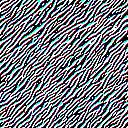

In [ ]:
_ = render.render_vis(vgg19, 'features_3:10', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 60.55it/s]



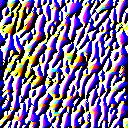

In [ ]:
_ = render.render_vis(vgg19, 'features_3:25', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 59.81it/s]



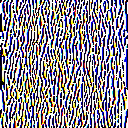

In [ ]:
_ = render.render_vis(vgg19, 'features_3:40', show_inline=True)

**Layer 6:** Tiene 128 filtros, por lo que seleccionaremos los filtros 20, 70 y 100.

100%|██████████| 512/512 [00:09<00:00, 56.40it/s]



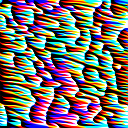

In [ ]:
_ = render.render_vis(vgg19, 'features_6:20', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 56.93it/s]



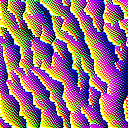

In [ ]:
_ = render.render_vis(vgg19, 'features_6:70', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 57.37it/s]



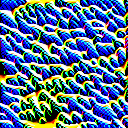

In [ ]:
_ = render.render_vis(vgg19, 'features_6:100', show_inline=True)

$ \underline{Capas \ \ medias:} $

**Layer 17:** Tiene 256 filtros, por lo que seleccionaremos los filtros 50, 180 y 250.

100%|██████████| 512/512 [00:11<00:00, 44.20it/s]



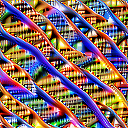

In [ ]:
_ = render.render_vis(vgg19, 'features_17:50', show_inline=True)

100%|██████████| 512/512 [00:11<00:00, 44.64it/s]



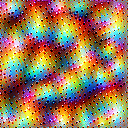

In [ ]:
_ = render.render_vis(vgg19, 'features_17:180', show_inline=True)

100%|██████████| 512/512 [00:11<00:00, 44.66it/s]



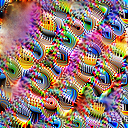

In [ ]:
_ = render.render_vis(vgg19, 'features_17:250', show_inline=True)

**Layer 20:** Tiene 512 filtros, por lo que seleccionaremos los filtros 150, 300 y 450.

100%|██████████| 512/512 [00:12<00:00, 42.35it/s]



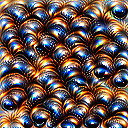

In [ ]:
_ = render.render_vis(vgg19, 'features_20:150', show_inline=True)

100%|██████████| 512/512 [00:12<00:00, 42.53it/s]



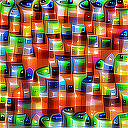

In [ ]:
_ = render.render_vis(vgg19, 'features_20:300', show_inline=True)

100%|██████████| 512/512 [00:12<00:00, 42.50it/s]



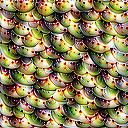

In [ ]:
_ = render.render_vis(vgg19, 'features_20:450', show_inline=True)

$ \underline{Capas \ \ finales:} $

**Layer 31:** Tiene 512 filtros, por lo que seleccionaremos los filtros 150, 300 y 450.

100%|██████████| 512/512 [00:15<00:00, 33.09it/s]



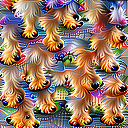

In [ ]:
_ = render.render_vis(vgg19, 'features_31:150', show_inline=True)

100%|██████████| 512/512 [00:15<00:00, 33.19it/s]



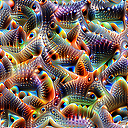

In [ ]:
_ = render.render_vis(vgg19, 'features_31:300', show_inline=True)

100%|██████████| 512/512 [00:15<00:00, 33.24it/s]



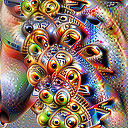

In [ ]:
_ = render.render_vis(vgg19, 'features_31:450', show_inline=True)

**Layer 35:** Tiene 512 filtros, por lo que seleccionaremos los filtros 150, 300 y 450.

100%|██████████| 512/512 [00:16<00:00, 31.71it/s]



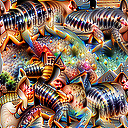

In [ ]:
_ = render.render_vis(vgg19, 'features_35:150', show_inline=True)

100%|██████████| 512/512 [00:16<00:00, 31.61it/s]



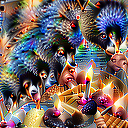

In [ ]:
_ = render.render_vis(vgg19, 'features_35:300', show_inline=True)

100%|██████████| 512/512 [00:16<00:00, 31.90it/s]



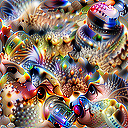

In [ ]:
_ = render.render_vis(vgg19, 'features_35:450', show_inline=True)

$ \underline{Comentarios:} $ $ \\ $

$ \ $ 

Como se observa, en las primeras capas los patrones que se pueden ver en los pesos son patrones muy simples, lo cual tiene mucho sentido pues recién estamos partiendo con la red. $ \\ $

$ \ $ 

Cuando ya avanzamos en la red observamos que en las capas intermedias los patrones observados son más complejos, lo cual tiene mucho sentido. $ \\ $

$ \ $

Y finalmente observamos que en las capas finales los patrones son altamente complejos y especificos lo cual tiene mucho sentido. En las imagenes se pueden apreciar tales complejidades y especifidades. 

# **Actividad 8:**

Primero que todo instalaremos y programaremos todo lo necesario para entrenar la red. Utilizaremos ResNet 50.

Es importante notar que toda la implementación que realizaremos estará basada en la ayudantía que realizó el ayudante. 

$ \ $ \\

_Link notebook:_

https://colab.research.google.com/drive/1uPQVB0gJEFVhKQ42gNwhJPXS7FCr9ZAv?usp=sharing

In [ ]:
import math
import torch
import random
import numpy as np
import torchvision
import numpy as np
import flowers as fl
from tqdm import tqdm
from torch import nn, optim
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import torchvision.models as models
import torchvision.transforms as transforms

In [ ]:
pip install matplotlib==3.1.1

     |████████████████████████████████| 13.1MB 241kB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: matplotlib 3.4.2
    Uninstalling matplotlib-3.4.2:
      Successfully uninstalled matplotlib-3.4.2


Aquí modificamos resnet50 y la dejamos **Preentrenada**. Como las clases son 102, le agregamos out_features=102. 

In [ ]:
def get_model(pretrained=None):
    
    model = models.resnet50(pretrained=True)
    model.fc = nn.Linear(in_features=2048, out_features=102, bias=True)

    model.to(device) # Envíamos el modelo a la GPU si está disponible
    return model

In [ ]:
def run_epoch(phase, model, loader, criterion, optimizer=None, epoch=0, total_epoch=0):
    n_batches = len(loader)
    if phase == 'train':
        model.train()
    elif phase == 'val' or 'test':
        model.eval()
        
    cum_loss = 0.0
    cum_acc = 0.0
    with tqdm(loader, unit='batch', position=0, leave=True) as tepoch:
        for n_batch, (x, y) in enumerate(tepoch, start=1):
            if phase == 'train': # Limpiamos los gradientes solo al entrenar
                optimizer.zero_grad()
                tepoch.set_description(f"Epoch {epoch}/{total_epoch}")

            x = x.to(device)
            y = y.to(device)
            result = model(x) # Aquí se ejecuta nuestro modelo
            
            loss = criterion(result, y) # Calculamos la pérdida
            cum_loss += loss.item()
            _, preds = torch.max(result, 1)
            cum_acc += torch.sum(preds == y.data)
            if phase == 'train':
                loss.backward() # Hacemos backpropagation solo en train
                optimizer.step() # Actualizamos parámetros solo en train

            current_cum_loss = cum_loss / n_batch
            current_cum_acc = cum_acc / (n_batch * batch_size)

            tepoch.set_postfix(Loss=current_cum_loss, Acc=current_cum_acc.item())
        
    epoch_loss = float(cum_loss / n_batch)
    epoch_acc = float(cum_acc / (n_batch * batch_size))
    return epoch_loss, epoch_acc

Creamos una función en la cual guardaremos la perdida y el accuracy tanto para el set de validación como el set de entrenamiento.

In [ ]:
def run_training(model, loader, val_loader, optimizer, criterion, n_epochs):
    history = {'train': {'loss': [], 'acc': []}, 'val': {'loss': [], 'acc': []}}

    for epoch in range(1, n_epochs + 1):
        epoch_loss, epoch_acc = run_epoch('train', model, loader, criterion, optimizer=optimizer, epoch=epoch, total_epoch=n_epochs)
        epoch_loss_val, epoch_acc_val = run_epoch('val', model, val_loader, criterion, optimizer=optimizer, epoch=epoch, total_epoch=n_epochs)

        # Registramos las pérdidas y accuracy por época tanto para el set de entrenamiento como para el de validación
        history['train']['loss'].append(epoch_loss)
        history['train']['acc'].append(epoch_acc)
        history['val']['loss'].append(epoch_loss_val)
        history['val']['acc'].append(epoch_acc)

    return history

In [ ]:
def run_testing(model, loader, criterion):
    test_loss, test_acc = run_epoch('test', model, loader, criterion)
    print()
    print_msg_box(f'\nTest loss: {test_loss:.4f}, Test acc.: {test_acc:.2f}\n', indent=5)
    return {'loss': test_loss, 'acc': test_acc}

Elegiremos un batch de 64. Notemos que usaremos imagenes de $ 224 \times 224 $.

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 224)), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 64

train_flowers = fl.Flowers('drive/MyDrive/DeepLearningUC/Tarea1/Parte2/flowers_dataset/train', transform=transform)

trainloader_flowers = torch.utils.data.DataLoader(train_flowers, batch_size=batch_size, shuffle=True)

val_flowers = fl.Flowers('drive/MyDrive/DeepLearningUC/Tarea1/Parte2/flowers_dataset/val', transform=transform)

valloader_flowers = torch.utils.data.DataLoader(val_flowers, batch_size=batch_size, shuffle=True)

test_flowers = fl.Flowers('drive/MyDrive/DeepLearningUC/Tarea1/Parte2/flowers_dataset/test', transform=transform)

testloader_flowers = torch.utils.data.DataLoader(test_flowers, batch_size=batch_size, shuffle=True)

In [ ]:
model = get_model(True)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

n_epocas = 20

z = run_training(model, trainloader_flowers, valloader_flowers, optimizer, criterion, n_epocas)

100%|██████████| 42/42 [00:33<00:00,  1.27batch/s, Acc=0.984, Loss=0.0502]


**Evolución de la función de perdida respecto a las epocas de entrenamiento**

*i. Set de entrenamiento*

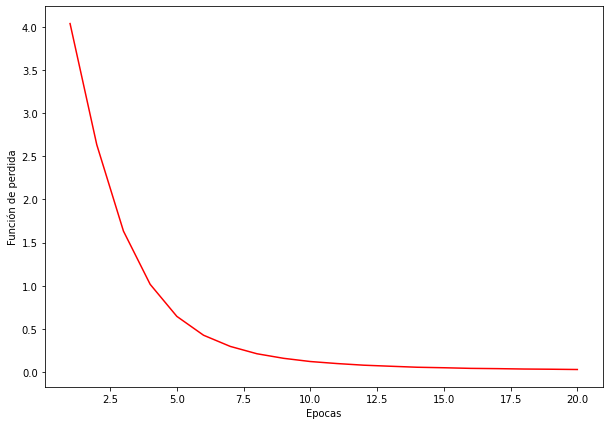

In [ ]:
train_loss = z['train']['loss']

epocas = []

for i in range(len(train_loss)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Función de perdida')

plt.plot(epocas, train_loss, color = "red")

*i. Set de entrenamiento (escala logaritmica)*

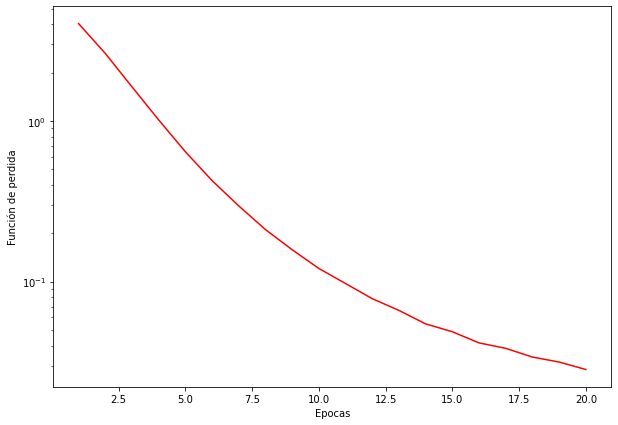

In [ ]:
train_loss = z['train']['loss']

epocas = []

for i in range(len(train_loss)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Función de perdida')

plt.yscale('log')

plt.plot(epocas, train_loss, color = "red")

*ii. Set de validación*

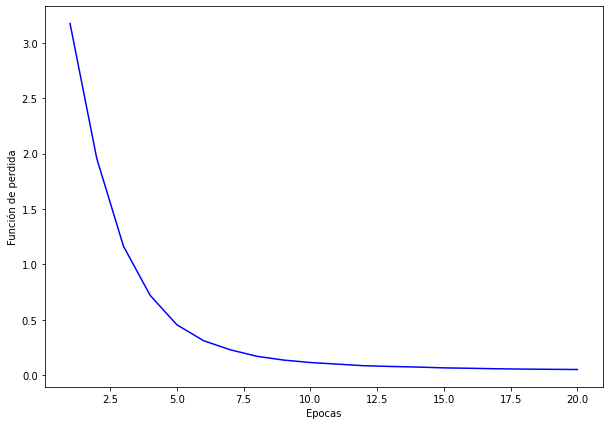

In [ ]:
val_loss = z['val']['loss']

epocas = []

for i in range(len(val_loss)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Función de perdida')

plt.plot(epocas, val_loss, color = "blue")

*ii. Set de validación (escala logaritmica)*

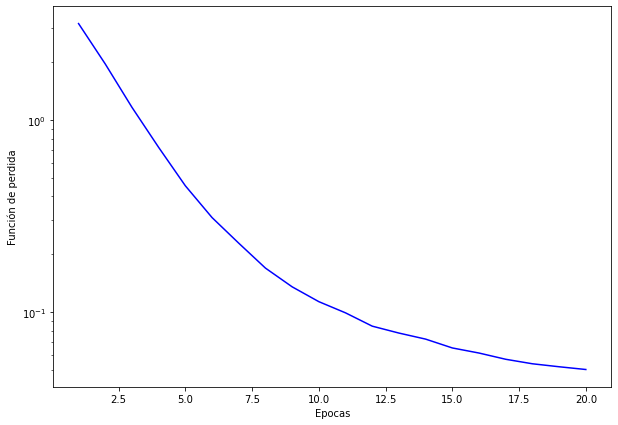

In [ ]:
val_loss = z['val']['loss']

epocas = []

for i in range(len(val_loss)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Función de perdida')

plt.yscale('log')

plt.plot(epocas, val_loss, color = "blue")

**Evolución de la precisión respecto a las epocas de entrenamiento**

In [ ]:
from matplotlib.offsetbox import AnchoredOffsetbox, TextArea

*i. Set de Entrenamiento*

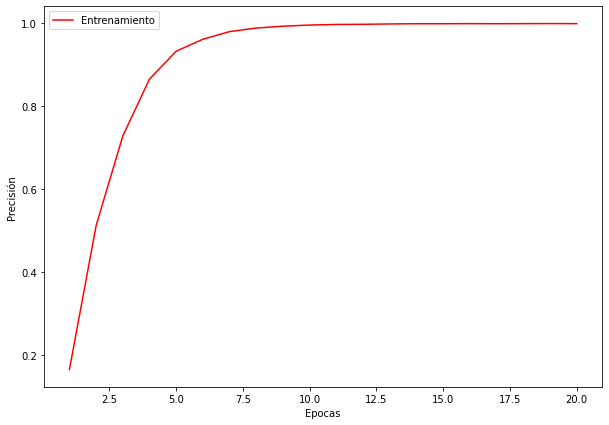

In [ ]:
acc_train = z['train']['acc']

epocas = []

for i in range(len(acc_train)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Precisión')

plt.plot(epocas, acc_train, color = "red")

plt.legend(['Entrenamiento'], loc='upper left')

plt.show()

*ii. Set de Validación*

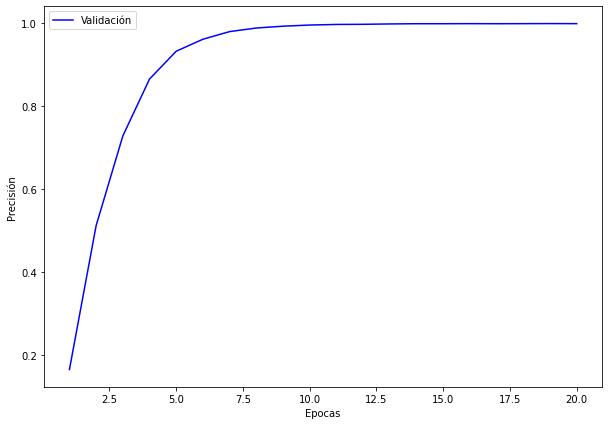

In [ ]:
acc_val = z['val']['acc']

epocas = []

for i in range(len(acc_val)):
  epocas.append(i+1)

figure(figsize=(10, 7))

plt.xlabel('Epocas')
plt.ylabel('Precisión')

plt.plot(epocas, acc_val, color = "blue")

plt.legend(['Validación'], loc='upper left')

plt.show()

$ \underline{Comentarios \ \ y \ \  An \acute{a} lisis \ \  de \ \ los \ \ gr \acute{a} ficos \ \ anteriores}: $ 

Como se observa, la función de perdida va disminuyendo su valor en función de las epocas rapidamente tanto en el set de entrenamiento como en el set de validación. También realizamos ambos gráficos en escala logaritmica en donde pudimos observar que este decaimiento es exponencial. $ \ $

$ \ $

Por otro lado, notemos que la precisión tanto para el set de entrenamiento como para el set de validación al principio va aumentando de manera drástica y luego se mentiene constante. $ \ $

$ \ $ 

Lo que podemos concluir de esto es que el entrenamiento se esta realizando de buena manera y que **NO HAY overfitting**, dado a que la precisión en el **set de validación** va mejorando a medida que pasan las epocas asi como la función de perdida va disminuyendo su valor. 

Ahora lo que haremos será calcular cual es la precisión en el **TEST SET** y además se mostraran 10 predicciones con sus respectivos labels originales.

**Precisión en el test set:**

In [ ]:
def precision_test_set(test_flowers):

  precision = 0

  for i in range(len(test_flowers)):

    if i % 27 == 0:
      porcentaje = math.floor((i/len(test_flowers))*100)
      print("Porcentaje:", porcentaje)

    image = test_flowers[i][0]
    label = test_flowers[i][1]

    image = image.to(device)
    image = image.unsqueeze(dim=0)
    probs = nn.functional.softmax(model(image), dim=1)

    prediccion = torch.argmax(probs).item()

    if prediccion == label:
      precision = precision + 1
    
  precision = precision/len(test_flowers)

  return precision

In [ ]:
precision_test = precision_test_set(test_flowers)

Porcentaje: 0
Porcentaje: 1
Porcentaje: 2
Porcentaje: 3
Porcentaje: 4
Porcentaje: 5
Porcentaje: 6
Porcentaje: 7
Porcentaje: 8
Porcentaje: 9
Porcentaje: 10
Porcentaje: 11
Porcentaje: 12
Porcentaje: 13
Porcentaje: 14
Porcentaje: 15
Porcentaje: 16
Porcentaje: 17
Porcentaje: 18
Porcentaje: 19
Porcentaje: 20
Porcentaje: 21
Porcentaje: 22
Porcentaje: 23
Porcentaje: 24
Porcentaje: 25
Porcentaje: 26
Porcentaje: 27
Porcentaje: 28
Porcentaje: 29
Porcentaje: 30
Porcentaje: 31
Porcentaje: 32
Porcentaje: 33
Porcentaje: 34
Porcentaje: 35
Porcentaje: 36
Porcentaje: 37
Porcentaje: 38
Porcentaje: 39
Porcentaje: 40
Porcentaje: 41
Porcentaje: 42
Porcentaje: 43
Porcentaje: 44
Porcentaje: 45
Porcentaje: 46
Porcentaje: 47
Porcentaje: 48
Porcentaje: 49
Porcentaje: 50
Porcentaje: 51
Porcentaje: 52
Porcentaje: 53
Porcentaje: 54
Porcentaje: 55
Porcentaje: 56
Porcentaje: 57
Porcentaje: 58
Porcentaje: 59
Porcentaje: 60
Porcentaje: 61
Porcentaje: 62
Porcentaje: 63
Porcentaje: 64
Porcentaje: 65
Porcentaje: 66
Porce

In [ ]:
print("Precisión en el test set:", precision_test)

Precisión en el test set: 0.991747936984246


Como se observa la **precisión en el test set** es de $ 99,17 \% $, lo cual termina por confirmar que nuestra red se entreno de buena manera **sin overfitting**.

**Mostraremos ahora 10 predicciones con sus respectivos labels originales**

In [ ]:
for i in range(10):
  image = test_flowers[i*266][0]
  label = test_flowers[i*266][1]
  
  image = image.to(device)
  image = image.unsqueeze(dim=0)
  probs = nn.functional.softmax(model(image), dim=1)
  
  prediccion = torch.argmax(probs).item()

  print("---------------------------")

  print("Predicción: ", prediccion)
  print("Etiqueta real:", label)

  print("---------------------------")

---------------------------
Predicción:  15
Etiqueta real: 15
---------------------------
---------------------------
Predicción:  19
Etiqueta real: 19
---------------------------
---------------------------
Predicción:  30
Etiqueta real: 30
---------------------------
---------------------------
Predicción:  4
Etiqueta real: 4
---------------------------
---------------------------
Predicción:  43
Etiqueta real: 43
---------------------------
---------------------------
Predicción:  58
Etiqueta real: 58
---------------------------
---------------------------
Predicción:  74
Etiqueta real: 74
---------------------------
---------------------------
Predicción:  72
Etiqueta real: 72
---------------------------
---------------------------
Predicción:  87
Etiqueta real: 87
---------------------------
---------------------------
Predicción:  96
Etiqueta real: 96
---------------------------


Este ejercicio se hizo para mostrar con ejemplos especificos como está prediciendo la red en el **test set**.

# **Actividad 9:**

**Comparación de features:**

Primero que todo revisemos cuales son todos los layers del modelo.

In [ ]:
get_model_layers(model)

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer1_0',
 'layer1_0_conv1',
 'layer1_0_bn1',
 'layer1_0_conv2',
 'layer1_0_bn2',
 'layer1_0_conv3',
 'layer1_0_bn3',
 'layer1_0_relu',
 'layer1_0_downsample',
 'layer1_0_downsample_0',
 'layer1_0_downsample_1',
 'layer1_1',
 'layer1_1_conv1',
 'layer1_1_bn1',
 'layer1_1_conv2',
 'layer1_1_bn2',
 'layer1_1_conv3',
 'layer1_1_bn3',
 'layer1_1_relu',
 'layer1_2',
 'layer1_2_conv1',
 'layer1_2_bn1',
 'layer1_2_conv2',
 'layer1_2_bn2',
 'layer1_2_conv3',
 'layer1_2_bn3',
 'layer1_2_relu',
 'layer2',
 'layer2_0',
 'layer2_0_conv1',
 'layer2_0_bn1',
 'layer2_0_conv2',
 'layer2_0_bn2',
 'layer2_0_conv3',
 'layer2_0_bn3',
 'layer2_0_relu',
 'layer2_0_downsample',
 'layer2_0_downsample_0',
 'layer2_0_downsample_1',
 'layer2_1',
 'layer2_1_conv1',
 'layer2_1_bn1',
 'layer2_1_conv2',
 'layer2_1_bn2',
 'layer2_1_conv3',
 'layer2_1_bn3',
 'layer2_1_relu',
 'layer2_2',
 'layer2_2_conv1',
 'layer2_2_bn1',
 'layer2_2_conv2',
 'layer2_2_bn2',
 'layer

Como se observa son 4 layers. Ya que no son tantos layers, entonces realizaremos la visualización de todos los pesos (Layer 1, 2, 3 y 4) y para cada uno se visualizaran los canales 1, 5 y 10.



**Layer 1:**

100%|██████████| 512/512 [00:07<00:00, 72.41it/s]



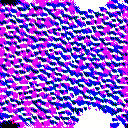

In [ ]:
_ = render.render_vis(model, 'layer1:1', show_inline=True)

100%|██████████| 512/512 [00:07<00:00, 71.95it/s]



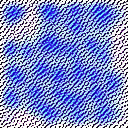

In [ ]:
_ = render.render_vis(model, 'layer1:5', show_inline=True)

100%|██████████| 512/512 [00:07<00:00, 71.35it/s]



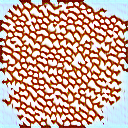

In [ ]:
_ = render.render_vis(model, 'layer1:10', show_inline=True)

**Layer 2:**

100%|██████████| 512/512 [00:08<00:00, 59.14it/s]



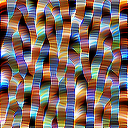

In [ ]:
_ = render.render_vis(model, 'layer2:1', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 59.98it/s]



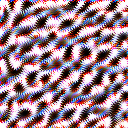

In [ ]:
_ = render.render_vis(model, 'layer2:5', show_inline=True)

100%|██████████| 512/512 [00:08<00:00, 58.98it/s]



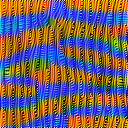

In [ ]:
_ = render.render_vis(model, 'layer2:10', show_inline=True)

**Layer 3:**

100%|██████████| 512/512 [00:10<00:00, 48.21it/s]



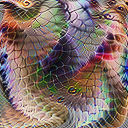

In [ ]:
_ = render.render_vis(model, 'layer3:1', show_inline=True)

100%|██████████| 512/512 [00:10<00:00, 48.22it/s]



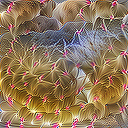

In [ ]:
_ = render.render_vis(model, 'layer3:5', show_inline=True)

100%|██████████| 512/512 [00:10<00:00, 47.57it/s]



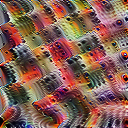

In [ ]:
_ = render.render_vis(model, 'layer3:10', show_inline=True)

**Layer 4:**

100%|██████████| 512/512 [00:12<00:00, 39.95it/s]



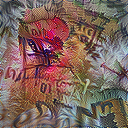

In [ ]:
_ = render.render_vis(model, 'layer4:1', show_inline=True)

100%|██████████| 512/512 [00:12<00:00, 39.79it/s]



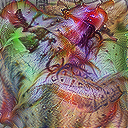

In [ ]:
_ = render.render_vis(model, 'layer4:5', show_inline=True)

100%|██████████| 512/512 [00:12<00:00, 39.62it/s]



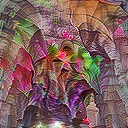

In [ ]:
_ = render.render_vis(model, 'layer4:10', show_inline=True)

$ \underline{Comentarios:} $

Como se observa en el layer 1 (que corresponde a un layer inicial) los pesos estan capturando un patron muy simple. Luego en los layer 2 y 3 (que corresponden a layers intermedios) los pesos estan capturando patrones mas complejos y finalmente en el layer 4 (que corresponde a layer finales) los pesos estan capturando un patron altamente complejo especifico. 


**Analisis de Labels:**

Analizaremos los labels 25, 50 y 75.

Primero que todo vamos a redefinir el train set de flowers de modo que sus tamaños no esten reajustados y así las imagenes se vean más claras.

In [ ]:
transform = transforms.Compose([transforms.ToTensor()])

train_flowers = fl.Flowers('drive/MyDrive/DeepLearningUC/Tarea1/Parte2/flowers_dataset/train', transform = transform)

*Label 25:*

100%|██████████| 512/512 [00:13<00:00, 39.29it/s]



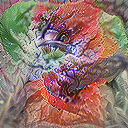

In [ ]:
_ = render.render_vis(model, 'labels:25', show_inline=True)

Ahora encontraremos imagenes del label 25 para el training set.

In [ ]:
def retornar_indices_clase(numero):
  indices = []
  for i in range(len(train_flowers)):
    if train_flowers[i][1] == numero:
      indices.append(i)
  return indices

In [ ]:
indices_25 = retornar_indices_clase(25)

In [ ]:
ind_25_1 = indices_25[0]
ind_25_2 = indices_25[1]
ind_25_3 = indices_25[2]

In [ ]:
image_25_1 = train_flowers[ind_25_1][0]
image_25_2 = train_flowers[ind_25_2][0]
image_25_3 = train_flowers[ind_25_3][0]

In [ ]:
trans = transforms.ToPILImage()

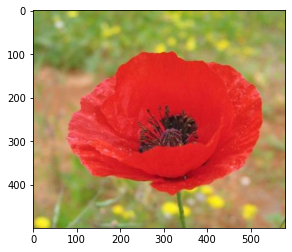

In [ ]:
plt.imshow(trans(image_25_1))

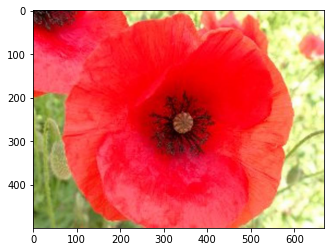

In [ ]:
plt.imshow(trans(image_25_2))

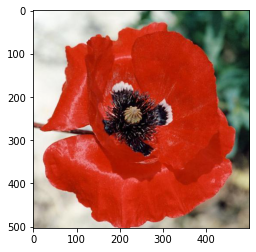

In [ ]:
plt.imshow(trans(image_25_3))

$ \underline{Comentario:} $

Si comparamos el "label 25" con las imagenes respectivas de su clase que hemos presentado, notemos que el label es de una tonalidad rojiza al igual que las imagenes asociadas y se puede observar en el label un "especie de textura" que se parece mucho a la de las imagenes respectivas. 

*Label 50:*

100%|██████████| 512/512 [00:13<00:00, 38.79it/s]



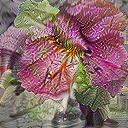

In [ ]:
_ = render.render_vis(model, 'labels:50', show_inline=True)

Ahora encontraremos imagenes del label 50 para el training set.

In [ ]:
indices_50 = retornar_indices_clase(50)

In [ ]:
ind_50_1 = indices_50[0]
ind_50_2 = indices_50[1]
ind_50_3 = indices_50[2]

In [ ]:
image_50_1 = train_flowers[ind_50_1][0]
image_50_2 = train_flowers[ind_50_2][0]
image_50_3 = train_flowers[ind_50_3][0]

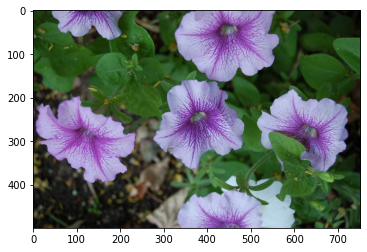

In [ ]:
plt.imshow(trans(image_50_1))

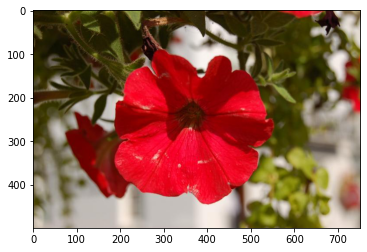

In [ ]:
plt.imshow(trans(image_50_2))

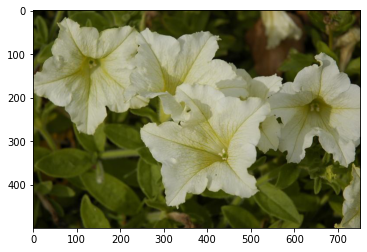

In [ ]:
plt.imshow(trans(image_50_3))

$ \underline{Comentario:} $



Si comparamos el "label 50" con las imagenes respectivas de su clase que hemos presentado, notemos que se puede observar claramente en el label un "especie de textura" que se parece mucho a la de las imagenes respectivas. 

*Label 75:*

100%|██████████| 512/512 [00:13<00:00, 38.42it/s]



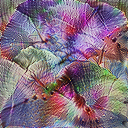

In [ ]:
_ = render.render_vis(model, 'labels:75', show_inline=True)

Ahora encontraremos imagenes del label 75 para el training set.

In [ ]:
indices_75 = retornar_indices_clase(75)

In [ ]:
ind_75_1 = indices_75[0]
ind_75_2 = indices_75[1]
ind_75_3 = indices_75[2]

In [ ]:
image_75_1 = train_flowers[ind_75_1][0]
image_75_2 = train_flowers[ind_75_2][0]
image_75_3 = train_flowers[ind_75_3][0]

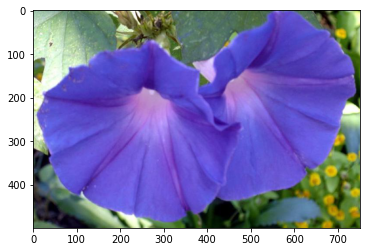

In [ ]:
plt.imshow(trans(image_75_1))

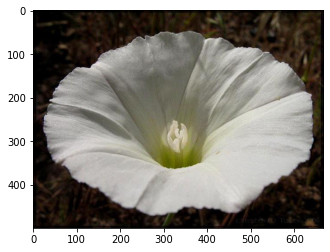

In [ ]:
plt.imshow(trans(image_75_2))

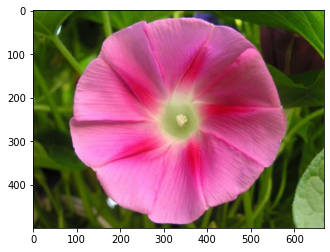

In [ ]:
plt.imshow(trans(image_75_3))

$ \underline{Comentario:} $

Si comparamos el "label 75" con las imagenes respectivas de su clase que hemos presentado, notemos que se puede observar **MUY claramente** en el label un "especie de textura" que se parece mucho a la de las imagenes respectivas. 

$ \huge Parte \ III: Detecci \acute{o} n \ de \ Objetos $


# **Actividad 10:**

**Non-maximum suppresion**

Cuando nosotros estamos trabajando con detección de objetos tenemos que generar propuestas sobre donde esta el objeto correspondiente. Muchos enfoques utilizan la idea de "ventana deslizante" es decir una ventana que se va moviendo por toda la imagen y que para cada punto en el que se detiene le asigna un "score" de que el objeto este efectivamente en ese punto. Sin embargo, uno puede inducir que procesar todas estas propuestas a través de la red neuronal es engorroso, es así, que surge el concepto de "Non-maximum suppresion" que filtra las propuestas (proposals) en función de algunos criterios.

$ \ $

$ \underline{Algoritmo:} $

$ \ $

_Input:_ Una lista de propuestas de bounding box 'B', con sus respectivos scores 'S' y un umbral de superposición 'umbral'. 

$ \ $ 

_Output:_ Una lista de propuestas filtradas 'D'. 


1. Selecciona la propuesta de B con puntuación más alta, eliminela de B y agreguela a D. (D parte vacía).

2. Ahora el proposal mencionado en el paso anterior, comparelo con todos los proposal de de B y si su IoU (intersection over union, pondremos una imagen explicando esto) es mayor que el 'umbral', entonces elimine ese elemento de B.

3. Nuevamente tome los elementos de B, seleccione el de mayor 'score' y agreguelo en D. 

4. Repita el paso 2. 

5. Repita hasta que no queden elementos en 'B'.

Ahora mostraremos que significa (IoU):

$ \ $ 

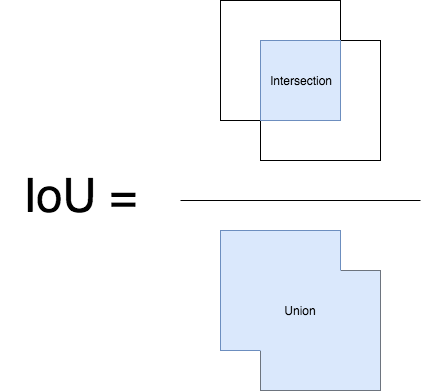

Para responder esta pregunta no basamos de la siguiente página.

**Link:** https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c

Ahora instanciaremos e imprimiremos el modelo para visualizar las componentes.

In [ ]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn

Instancia de Faster RCNN ResNet 50

In [ ]:
frcnn_model = fasterrcnn_resnet50_fpn(pretrained=True, progress=True, num_classes=91, pretrained_backbone=True, trainable_backbone_layers=3)

Imprimimos Faster RCNN ResNet 50

In [ ]:
frcnn_model

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

Ahora pasaremos a explicar en que consiste cada una de las siguientes componentes:

**Backbone:** Es una estructura muy importante en una red neuronal. Tal cual su nombre indica, cumple el rol de columna vertebral de una red neuronal. Consiste en una componente que extrae características a partir de la imagen de entrada y luego estas caracteristicas se muestrean para toda la red neuronal. 

**Feature Pyramid Network (FPN):** Una Feature Pyramid Network es un extractor de características que toma una imagen de una sola escala de un tamaño arbitrario como entrada y genera mapas de características de tamaño proporcional en múltiples niveles, de una manera totalmente convolucional. Todo esto es independiente del backbone que se utilice. 
De este modo, actúa como una solución genérica para construir pirámides de características dentro de redes convolucionales profundas que se utilizarán en tareas como la detección de objetos.

**Region Proposal Network (RPN):** Es una red neuronal que esta sobre la ultima capa convolucional y que tiene como objetivo proponer cuales son los "Proposals" indicados para los objetos identificados en la red neuronal.

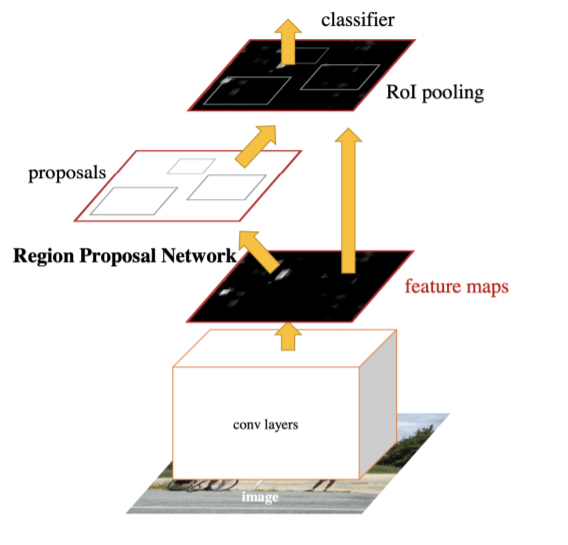

# **Actividad 11:**

**i.**

Programaremos en primer lugar una función que recibe como entrada un modelo, un imagen y un umbral y esta función nos retorna los bounding boxes, clases y scores de las detecciones de objetos en la imagen de entrada. 

Pero primero instalaremos librerias necesarias. 

In [ ]:
import torch
import numpy as np
from PIL import Image
from os import listdir
from os.path import join
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from torchvision.transforms import Compose, ToTensor, Resize

Además crearemos un diccionario de las clases asociadas al DATASET de COCO.

In [ ]:
with open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/diccionario_COCO.txt') as f:
  lines = f.readlines()

In [ ]:
class_to_name = {}

for i in range(len(lines)):
  if i == len(lines) - 1:
    class_to_name[i+1] = lines[i]
  else:
    class_to_name[i+1] = lines[i][0:-1]

Ahora si programamos la función.

In [ ]:
def evaluar_modelo_imagen(modelo, imagen, umbral):
  # Dejamos el modelo en modo evaluación
  modelo.eval()

  # Agarramos la imagen y la evaluamos en el modelo
  img = np.array(imagen)
  img = ToTensor()(img)
  out = modelo([img])

  boxes = []
  labels = []
  scores = []
  names = []

  dictionary_model = {}

  for i in range(len(out[0]['scores'])):

    if float(out[0]['scores'][i]) >= umbral:

      scores.append(float(out[0]['scores'][i]))

      box = out[0]['boxes'][i]

      boxes.append(box.tolist())

      label = int(out[0]['labels'][i])
      
      labels.append(label)

      names.append(class_to_name[label])

    
    dictionary_model['boxes'] = boxes
    dictionary_model['labels'] = labels
    dictionary_model['scores'] = scores
    dictionary_model['names'] = names

  return dictionary_model

**ii.**

Ahora programaremos una funcion para visualizar en la imagen utilizada, los bounding boxes, etiquetas y scores de las detecciones. Con respecto a los scores, aproximaremos a dos decimas.

In [ ]:
def graficar_imagen_bounding_boxes(modelo, imagen, umbral):
  out = evaluar_modelo_imagen(modelo, imagen, umbral)

  boxes = out['boxes']
  names = out['names']
  scores = out['scores']

  # Create figure and axes
  fig, ax = plt.subplots(figsize = (10, 10))

  # Display the image
  ax.imshow(imagen)

  for ind in range(len(scores)):
    x,y,w,h = boxes[ind]
    w = w-x
    h = h-y

     # Create a Rectangle patch
    rect = patches.Rectangle((x, y-10), w, h, linewidth=1, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)

    # Add text

    texto = str(names[ind]) + ". " + str(round(scores[ind],2)) + "."

    ax.text(x, y, texto, fontsize = 8, color = 'black', backgroundcolor = 'white')

  plt.show()

Ahora realizaremos inferencia sobre 5 imagenes (si haremos 2 más que las pedidas, pero es para mostrar de mejor manera el funcionamiento de la red). Usaremos el umbral de $ 85 \% $.

**Imagen 1:**

In [ ]:
imagen_1 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/airplane.jpg')

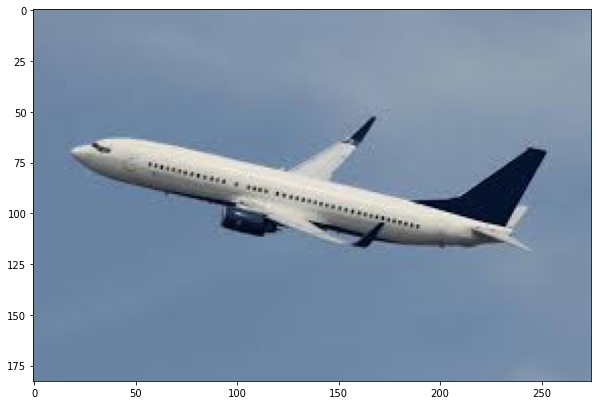

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_1)
plt.show()

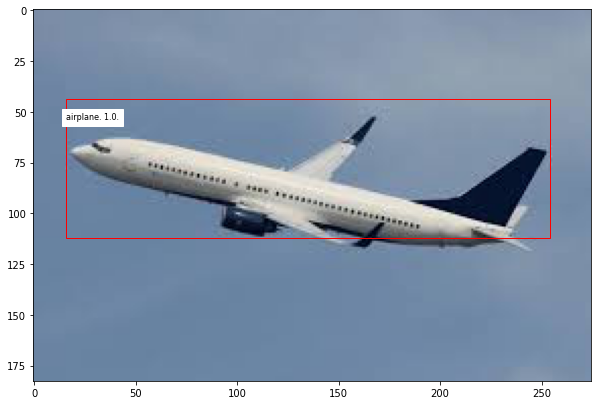

In [ ]:
grafico_1 = graficar_imagen_bounding_boxes(frcnn_model, imagen_1, 0.85)

**Imagen 2:**


In [ ]:
imagen_2 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/cristiano.jpg')

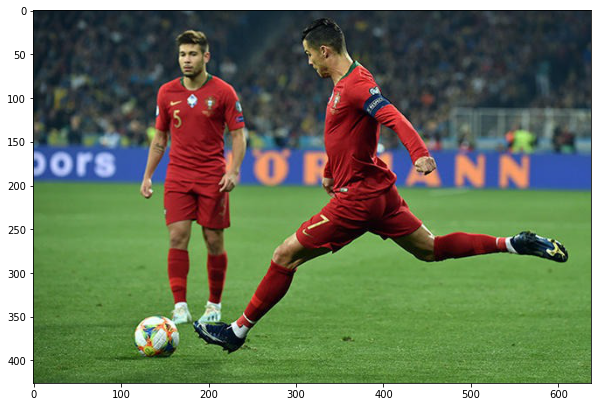

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_2)
plt.show()

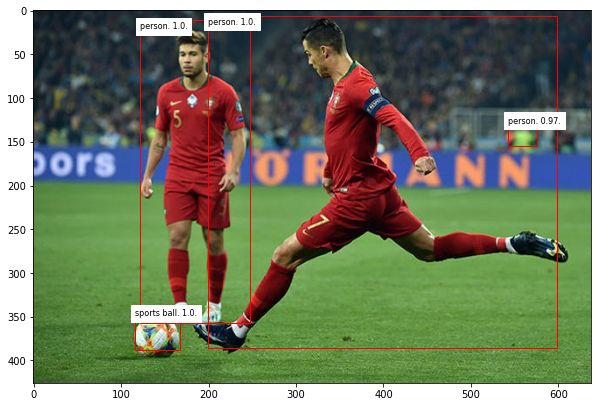

In [ ]:
grafico_2 = graficar_imagen_bounding_boxes(frcnn_model, imagen_2, 0.85)

**Imagen 3:**

In [ ]:
imagen_3 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/comida.jpg')

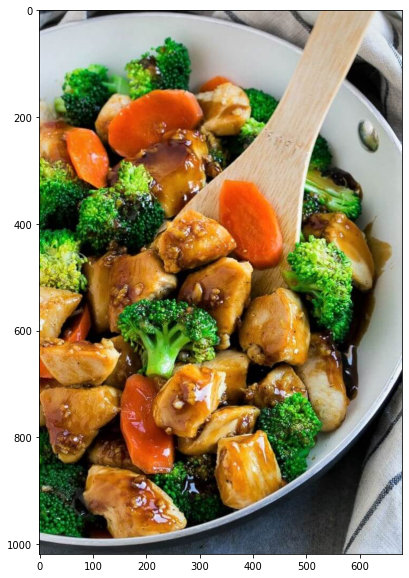

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_3)
plt.show()

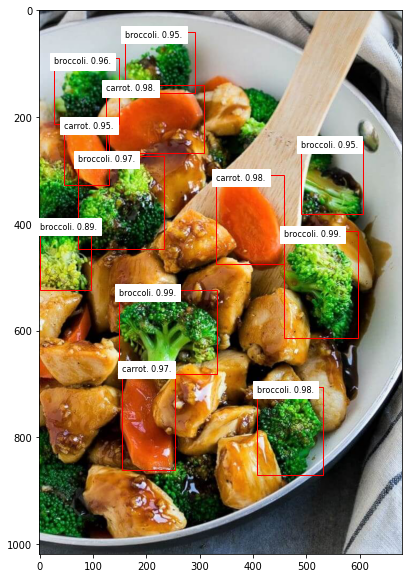

In [ ]:
grafico_3 = graficar_imagen_bounding_boxes(frcnn_model, imagen_3, 0.85)

**Imagen 4:**

In [ ]:
imagen_4 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/playa.jpg')

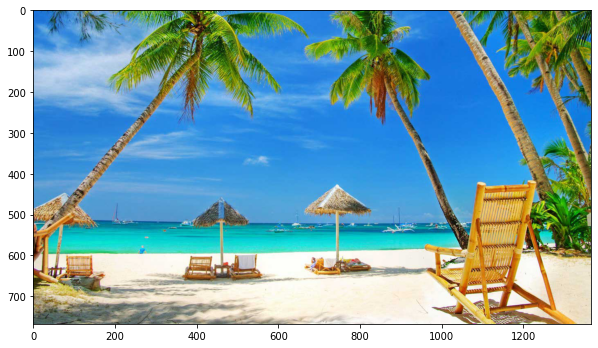

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_4)
plt.show()

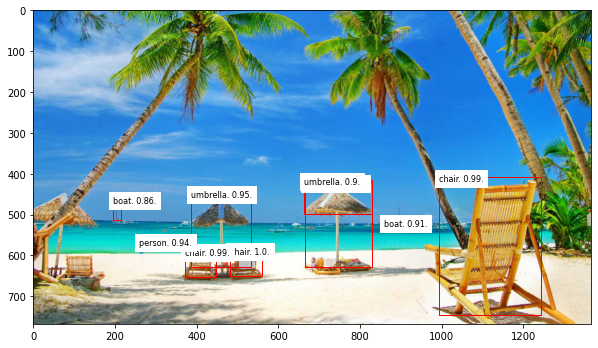

In [ ]:
grafico_4 = graficar_imagen_bounding_boxes(frcnn_model, imagen_4, 0.85)

**Imagen 5:**

In [ ]:
imagen_5 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad11/completo.jpg')

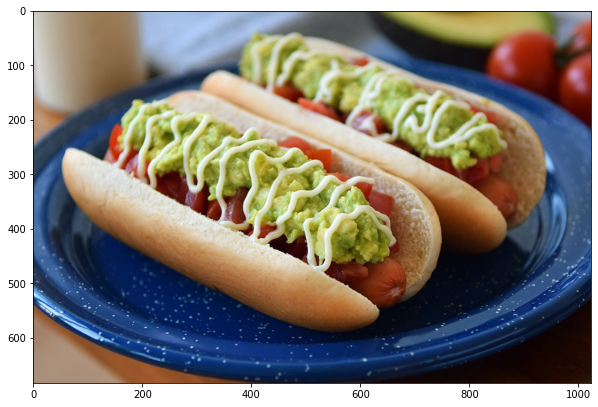

In [ ]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_5)
plt.show()

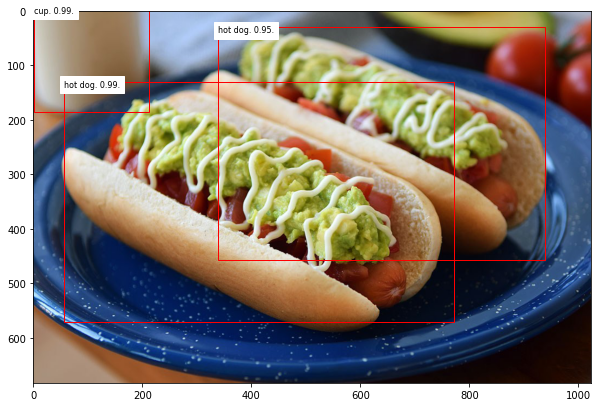

In [ ]:
grafico_5 = graficar_imagen_bounding_boxes(frcnn_model, imagen_5, 0.85)

$ \underline{Comentario:} $ Notemos que para todas las imagenes que se realizo inferencia, la red neuronal funciono muy bien, pues como se ve en las imagenes, las bounding boxes estan muy bien puestas y además los 'scores' asignados son muy altos cuando efectivamente estan los objetos correspondientes. 

$ \ $ 

Ahora pasaremos a la Actividad 12.

# **Actividad 12:**

Primero que todo, diremos que la aplicación de esta Actividad se baso en el siguiente tutorial de Pytorch:

https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

Primero que todo instalamos todos los paquetes necesarios. 

In [4]:
import os
import torch
import utils
import torchvision
import numpy as np
from PIL import Image
from os import listdir
from os.path import join
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import matplotlib.patches as patches
import torchvision.transforms as transforms
from engine import train_one_epoch, evaluate
from torchvision.transforms import Compose, ToTensor, Resize
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

Ahora creamos la clase RaccoonDataSet para poder cargar el "Train Set" y "Test Set".

In [5]:
class RaccoonDataSet(object):

  def __init__(self, root, transforms):
    self.root = root
    self.transforms = transforms
    #Abrimos el archivo para obtener rutas de imagenes, boxes y clases
    with open(self.root) as f:
      lines = f.readlines()
    self.rutas_imagenes = []
    self.boxes_todos = []
    self.clases_todas = []
    
    for i in range(len(lines)):
      separado = lines[i].split()
      ruta = str(separado[0])
      self.rutas_imagenes.append(ruta)
      numero_de_labels = len(separado)-1
      boxes = []
      clases = []
      for j in range(numero_de_labels):
        x_min, y_min, x_max, y_max, clase = separado[j+1].split(",")
        box = [float(x_min), float(y_min), float(x_max), float(y_max)]
        boxes.append(box)
        clases.append(clase)
      self.boxes_todos.append(boxes)
      self.clases_todas.append(clases)

  def __getitem__(self, idx):
    img_path = self.rutas_imagenes[idx]
    img_path = 'drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/' + img_path
    img = Image.open(img_path).convert("RGB")
    num_objs = len(self.boxes_todos[idx])
    boxes = []

    for i in range(num_objs):
      boxes.append(self.boxes_todos[idx][i])
    
    boxes = torch.as_tensor(boxes, dtype=torch.float32)
    labels = torch.ones((num_objs,), dtype=torch.int64)
    image_id = torch.tensor([idx])
    area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
    iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

    target = {}
    target["boxes"] = boxes
    target["labels"] = labels
    target["image_id"] = image_id
    target["area"] = area
    target["iscrowd"] = iscrowd

    if self.transforms is not None:
            img, target = self.transforms(img), target
            # Se hace transforms en img
    return img, target

  def __len__(self):
    return len(self.rutas_imagenes)

Ahora instanciaremos faster rcnn resnet 50 **preentrenado** y modificaremos el head tal cual piden por enunciado.

In [6]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 2 
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


Ahora crearemos el "Train Set" y el "Test Set". 

In [7]:
transform = transforms.Compose([transforms.ToTensor()])
raccon_train_set = RaccoonDataSet('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/Raccoon_dataset/raccoon_train_data.txt', transform)
raccon_test_set = RaccoonDataSet('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/Raccoon_dataset/raccoon_test_data.txt', transform)

Ahora vamos a describir lo que son "True Positive", "True Negative", "False Negative" y "False Positive" para así graficar estas cantidades.

$ \ $ 


**True Positive (TP):** La verdad es que es verdadero y la predicción dice que es verdadero.

**True Negative (TP):** La verdad es que es negativo y la predicción dice que es negativo. 

**False Negative (FN):** La verdad es que es positivo pero se predice como negativo.

**False Positive (FP):** La veerdad es que es negativo, pero se predice como positivo.

$ \ $ 

Ahora vamos a mostrar como se calculan las otras medidas que vamos a graficar a partir de TP, FP, TN, FN. 

_Recall =_ $ \cfrac{TP}{TP + FN} $.

_Precisión =_ $ \cfrac{TP}{TP+FP} $.

_Medida f1 =_ $ 2 \cdot \cfrac{precision \cdot recall}{precision + recall} $

$ \ $

$ \ $

**Contexto de anchor boxes**

Ahora para el caso donde estamos prediciendo anchor boxes lo que hacemos es definir la siguiente medida:

$ IoU = \cfrac{Intersection}{Union} $

Sean $ A $ y $ B $ dos cajas, sabemos que:

$ Intersection = |A \cap B| $

$ Union = | A \cup B | = |A| + |B| - |A \cap B | $ 

De esta forma:

$ \boxed{ IoU = \cfrac{|A \cap B|}{|A| + |B| - |A \cap B |} } $

$ \ $ 

**Criterio a utilizar**

Para este caso la convención que utilizaremos será que:

1. Si IoU es mayor o igual a $0.5$ entonces TP suma 1.
2. Si IoU es menor o igual a $0.5$ entonces FP suma 1.
3. Si no se detecta nada y hay algo entonces FN suma 1.
4. TN siempre será 0.

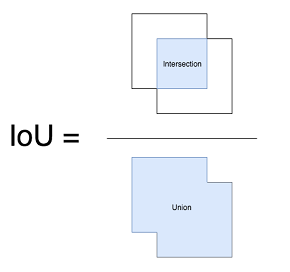

Ahora notemos que el criterio para evaluar como van evolucionando las medidas de desempeño será de la siguiente manera:

$ \ $

Como evaluaremos la evolución sobre el *Test Set* lo que haremos será que una vez terminada una epoca para cada elemento del test set, calcularemos cuales son todas las boxes predichas y las compararemos con las boxes reales. Ahí lo que haremos será un match en boxes predichas y boxes reales para que así **no ocurran cosas como que 1 box predicha esta asignada como la predicción de 2 boxes reales** y una vez realizado el match para cada par de boxes se utilizará el criterio anteriormente mencionado. Es decir, que si su IoU es mayor o igual a 0.5 se sumará un elemento a TP y de lo contrario se sumará un elemento a FP.

$ \ $ 

Otra pregunta que surge es ¿Que boxes predichas se considerarán? y se considerarán las boxes las cuales su score sea mayor a un umbral y nosotros en particular usaremos el umbral de $0,85$. 

$ \ $

Al terminar esta evaluación, repetiremos este mismo proceso para para el **train set** solo para ver como van evolucionando las medidas de desempeño del modelo sobre el trainset a medida que van pasando las epocas.

Este criterio se basó en lo publicado en la siguiente pagina:

https://towardsdatascience.com/evaluating-performance-of-an-object-detection-model-137a349c517b

In [8]:
def calcular_iou(box_1, box_2):
  x_1_min = box_1[0]
  y_1_min = box_1[1]
  x_1_max = box_1[2]
  y_1_max = box_1[3]

  x_2_min = box_2[0]
  y_2_min = box_2[1]
  x_2_max = box_2[2]
  y_2_max = box_2[3]

  x_min = max(x_1_min, x_2_min)
  x_max = min(x_1_max, x_2_max)
  y_min = max(y_1_min, y_2_min)
  y_max = min(y_1_max, y_2_max)

  ancho = max(x_max - x_min, 0)
  largo = max(y_max - y_min, 0)

  intersection = ancho*largo

  A_1 = (x_1_max - x_1_min)*(y_1_max - y_1_min)
  A_2 = (x_2_max - x_2_min)*(y_2_max - y_2_min)

  iou = intersection/(A_1 + A_2 - intersection)

  return iou

In [9]:
def math_2_set_boxes(boxes_1, boxes_2):
  FN = abs(len(boxes_2) - len(boxes_1))
  if len(boxes_2) >= len(boxes_1):
    boxes_menor = boxes_1
    boxes_mayor = boxes_2
  else:
    boxes_menor = boxes_2
    boxes_mayor = boxes_1
  TP = 0
  FP = 0
  for i in range(len(boxes_menor)):
    box_menor_etapa = boxes_menor[i]
    iou_lista = []
    if len(boxes_mayor) == 0:
      return [FN, TP, FP]
    else:
      for j in range(len(boxes_mayor)):
        box_mayor_esp = boxes_mayor[j]
        iou_lista.append(calcular_iou(box_menor_etapa, box_mayor_esp))
  
    max_iou = max(iou_lista)
    indice = iou_lista.index(max_iou)
    boxes_mayor_posible = boxes_mayor[indice]

    if max_iou >= 0.5:
      TP = TP + 1
      boxes_mayor.remove(boxes_mayor_posible)
    else:
      FP = FP + 1
  return [FN, TP, FP]

Ahora creamos la función que determina los TP, TN, FP, FN para cada epoca.

In [10]:
def calculo_medidas_evol(model, dataset, umbral):
  trans_ideal = transforms.ToPILImage()
  FP = 0
  FN = 0
  TP = 0
  TN = 0

  model.eval()

  for i in range(len(dataset)):

    boxes_reales = dataset[i][1]['boxes'].tolist()

    imagen = dataset[i][0]
    imagen = trans_ideal(imagen)

    img = np.array(imagen)
    img = ToTensor()(img)
    img = img.cuda()
    out = model([img])

    boxes_predichas = []

    for j in range(len(out[0]['scores'])):
      if float(out[0]['scores'][j]) >= umbral:
        boxes_predichas.append(out[0]['boxes'][j].tolist())

    FN_1, TP_1, FP_1 = math_2_set_boxes(boxes_reales, boxes_predichas)
  
    FN = FN + FN_1
    TP = TP + TP_1
    FP = FP + FP_1

  return [TP, FP, TN, FN]

Ahora creamos la función para entrenar la red neuronal.

In [40]:
def train_function(model, n_epochs):

    device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
    dataset = raccon_train_set
    dataset_test = raccon_test_set

    data_loader = torch.utils.data.DataLoader(dataset, batch_size=4, shuffle=True, num_workers=4, collate_fn=utils.collate_fn)

    model = model
    model.to(device)

    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.1)

    true_positive_train = []
    true_negative_train = []
    false_negative_train = []
    false_positive_train = []

    true_positive_test = []
    true_negative_test = []
    false_negative_test = []
    false_positive_test = []

    for epoch in range(n_epochs):
        train_one_epoch(model, optimizer, data_loader, device, epoch, print_freq=10)

        # Calcular medidas de desempeño
        umbral = 0.85

        # Se calculan las medidas de desempeño sobre el test set
        TP_train, FP_train, TN_train, FN_train = calculo_medidas_evol(model, dataset, umbral)
        TP_test, FP_test, TN_test, FN_test = calculo_medidas_evol(model, dataset_test, umbral)
        
        true_positive_train.append(TP_train)
        true_negative_train.append(TN_train)
        false_negative_train.append(FN_train)
        false_positive_train.append(FP_train)

        true_positive_test.append(TP_test)
        true_negative_test.append(TN_test)
        false_negative_test.append(FN_test)
        false_positive_test.append(FP_test)

        model.train()

        # Actualizamos el learning rate
        lr_scheduler.step()

    dic_train = {}
    dic_train['true positive'] = np.array(true_positive_train)
    dic_train['true negative'] = np.array(true_negative_train)
    dic_train['false negative'] = np.array(false_negative_train)
    dic_train['false positive'] = np.array(false_positive_train)

    dic_test = {}
    dic_test['true positive'] = np.array(true_positive_test)
    dic_test['true negative'] = np.array(true_negative_test)
    dic_test['false negative'] = np.array(false_negative_test)
    dic_test['false positive'] = np.array(false_positive_test)

    print("Termino el entrenamiento!")

    out = []
    out.append(dic_train)
    out.append(dic_test)

    return out

Ahora realizaremos el "Fine Tunning".

In [41]:
entrenamiento = train_function(model, 20)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch: [0]  [ 0/40]  eta: 0:00:58  lr: 0.000133  loss: 0.0632 (0.0632)  loss_classifier: 0.0258 (0.0258)  loss_box_reg: 0.0317 (0.0317)  loss_objectness: 0.0030 (0.0030)  loss_rpn_box_reg: 0.0027 (0.0027)  time: 1.4713  data: 0.3404  max mem: 7563
Epoch: [0]  [10/40]  eta: 0:00:40  lr: 0.001414  loss: 0.0574 (0.0600)  loss_classifier: 0.0172 (0.0182)  loss_box_reg: 0.0281 (0.0327)  loss_objectness: 0.0003 (0.0009)  loss_rpn_box_reg: 0.0059 (0.0083)  time: 1.3627  data: 0.0397  max mem: 7563
Epoch: [0]  [20/40]  eta: 0:00:26  lr: 0.002695  loss: 0.0578 (0.0645)  loss_classifier: 0.0170 (0.0187)  loss_box_reg: 0.0308 (0.0363)  loss_objectness: 0.0006 (0.0009)  loss_rpn_box_reg: 0.0062 (0.0086)  time: 1.3277  data: 0.0109  max mem: 7563
Epoch: [0]  [30/40]  eta: 0:00:13  lr: 0.003975  loss: 0.0626 (0.0647)  loss_classifier: 0.0170 (0.0189)  loss_box_reg: 0.0351 (0.0364)  loss_objectness: 0.0006 (0.0008)  loss_rpn_box_reg: 0.0084 (0.0086)  time: 1.2725  data: 0.0118  max mem: 7563
Epoch: [

Primero creemos una función que calcula las medidas rapidamente.

In [13]:
def calcular_medidas(mediciones):
  TP = mediciones['true positive']
  TN = mediciones['true negative']
  FP = mediciones['false positive']
  FN = mediciones['false negative']

  recall = TP/(TP+FN)
  precision = TP/(TP+FP)
  f1 = 2*((precision*recall)/(precision+recall))

  dic = {}
  dic['true positive'] = TP
  dic['true negative'] = TN
  dic['false positive'] = FP
  dic['false negative'] = FN
  dic['recall'] = recall
  dic['precision'] = precision
  dic['f1'] = f1
  
  return dic

Ahora crearemos una función que grafica las medidas facilmente.

In [42]:
def graficar(medidas, texto, color):

  medida_grafica = medidas[texto]
  epocas = []

  for i in range(len(medida_grafica)):
    epocas.append(i+1)

  figure(figsize=(10, 7))

  plt.xlabel('Epocas')
  plt.ylabel(texto)

  plt.plot(epocas, medida_grafica, color = color)

Ahora graficaremos las medidas de desempeño para el **TEST SET**

In [44]:
medidas_train, medidas_test = calcular_medidas(entrenamiento[0]), calcular_medidas(entrenamiento[1])

**True Positives:**

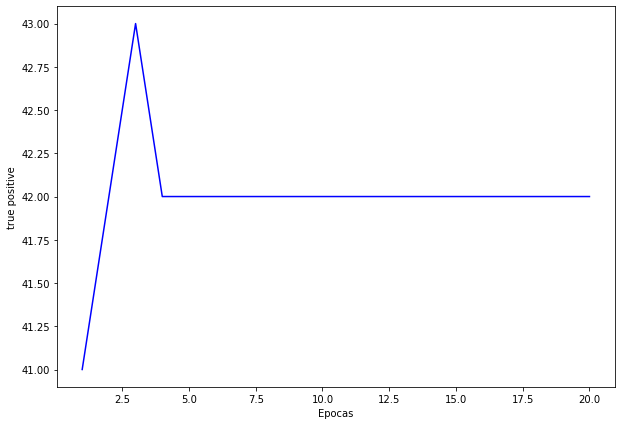

In [45]:
graficar(medidas_test, 'true positive', 'blue')

**True Negatives:**

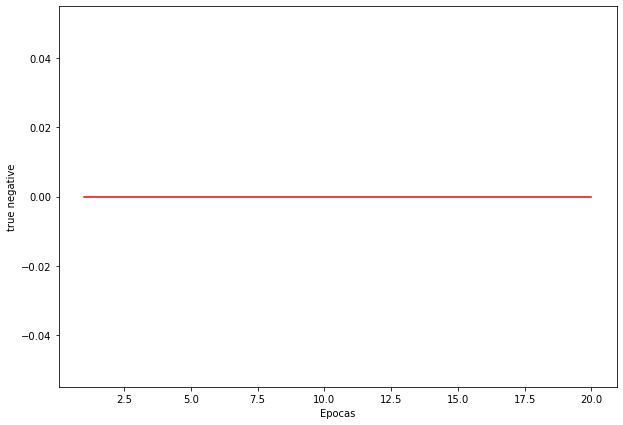

In [46]:
graficar(medidas_test, 'true negative', 'red')

**False Positives:**

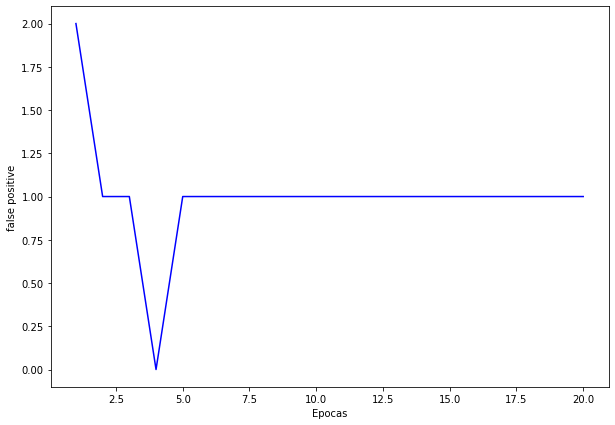

In [47]:
graficar(medidas_test, 'false positive', 'blue')

**False Negatives:**

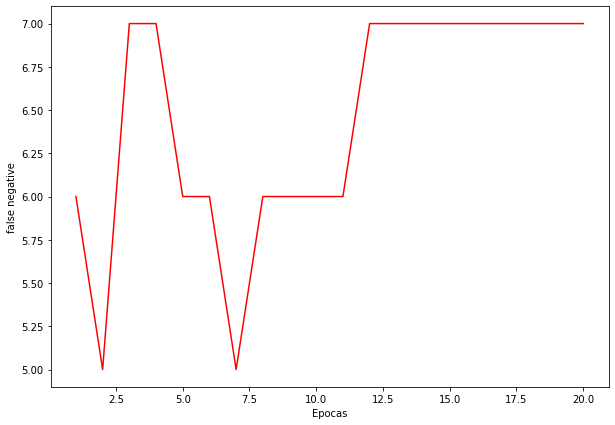

In [48]:
graficar(medidas_test, 'false negative', 'red')

**Precision:**

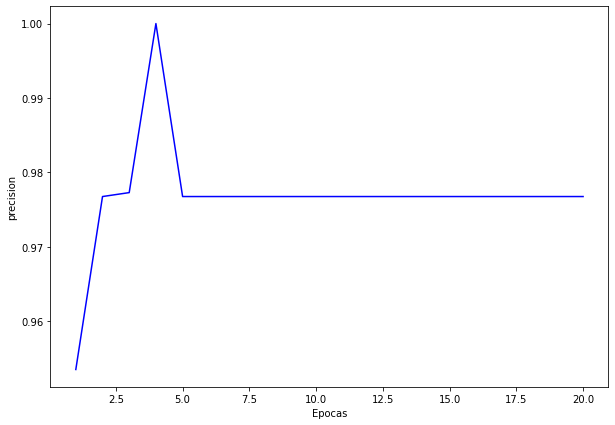

In [49]:
graficar(medidas_test, 'precision', 'blue')

**Recall:**

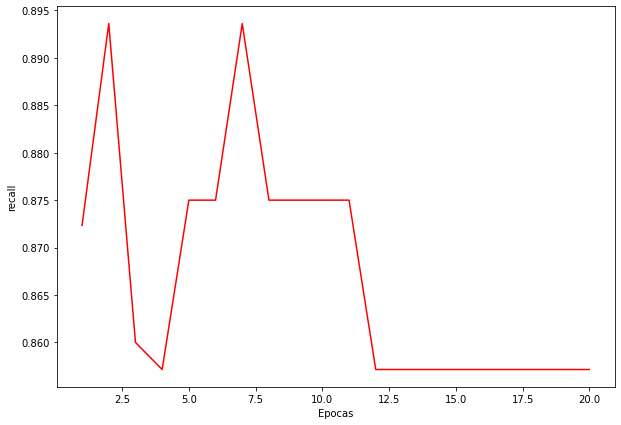

In [50]:
graficar(medidas_test, 'recall', 'red')

**Medida f1:**

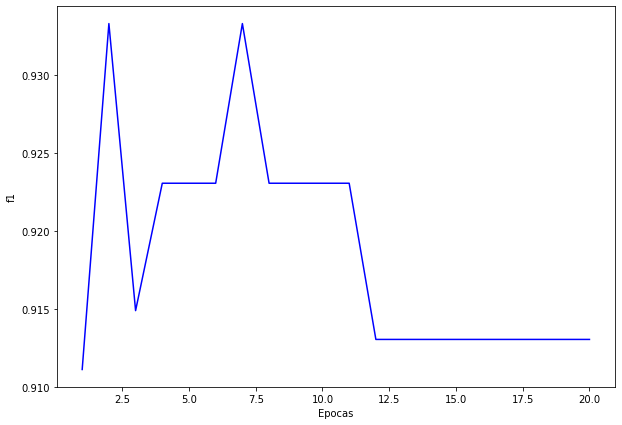

In [51]:
graficar(medidas_test, 'f1', 'blue')

$ \underline{Comentarios:} \ $ En los gráficos se puede observar que:

- Las **True Positives (TP)** van aumentando rápidamente su valor, de hecho antes de las primeras 5 epocas llega al valor máximo posible, para después mantenerse constante en un valor un poco más bajo que el máximo posible. 

- Las **True Negatives (TN)** siempre se mantendrán en el valor 0 como se comenta por enunciado. 

- Las **False Positives (FP)** van disminuyendo muy rapido, de hecho dentro de las primeras 5 épocas llega al valor de 0 y luego de eso se mantiene constante en el valor de 1 (el cual es muy bajo también).

- Las **False Negatives (FN)** son los que más varían, algunas veces disminuyen y otras veces aumenta, manteniendose constante después en un número de 7. Esto quiere decir que nuestro modelo detecta algunas veces mapaches cuando realmente no lo son.

- La **precisión** dentro de las primeras 5 epocas llega al valor de 1 y luego de eso se mantiene constante en un valor de 0.975 (el cual es muy bueno).

- El **recall** es una medida que también va variando bastante, sin embargo, luego de una cantidad de iteraciones se mantiene constante en el valor de 0.85.

- La medida **f1** que combina **precision y recall** también varía, pero luego de una cantidad de iteraciones se mantiene en un valor constante de 0.9125.

De esta manera, podemos decir que el modelo se ajuste de buena manera y **sin overfitting**. $ \ $

**Rendimiento en el Test Set** (Despues de acabado el entrenamiento)

In [52]:
test_medidas = calculo_medidas_evol(model, raccon_test_set, 0.85)

In [53]:
TP, FP, TN, FN = test_medidas

In [54]:
TP, FP, TN, FN

(42, 1, 0, 7)

Como se observa en el test set se obtiene:

$ TP = 42, \ FP = 1, \ TN = 0, \ FN = 7 $. 

In [55]:
recall = TP/(TP+FN)
precision = TP/(TP+FP)
f1 = 2*((precision*recall)/(precision+recall))

In [56]:
recall, precision, f1

(0.8571428571428571, 0.9767441860465116, 0.9130434782608695)

$ \ $ 

Por lo tanto:

$ \ $

_Recall =_ $ \cfrac{TP}{TP + FN} = 0.86 $.

_Precisión =_ $ \cfrac{TP}{TP+FP} = 0.98 $.

_Medida f1 =_ $ 2 \cdot \cfrac{precision \cdot recall}{precision + recall} = 0.91 $.

$ \ $

De esta forma nos damos cuenta que el desempeño en el test set es muy bueno una vez terminado el entrenamiento. Y por lo tanto **NO hay overfitting**. 

$ \ $

Como comentamos anteriormente, también graficaremos como evolucionan las medidas de desempeño sobre el **TRAIN SET** para ver como va evolucionando el entrenamiento. Sabemos que esto no se pide por enunciado pero se hará con **fines didacticos**. 

Ahora graficaremos las medidas de desempeño para el **TRAIN SET**

**True Positives:**

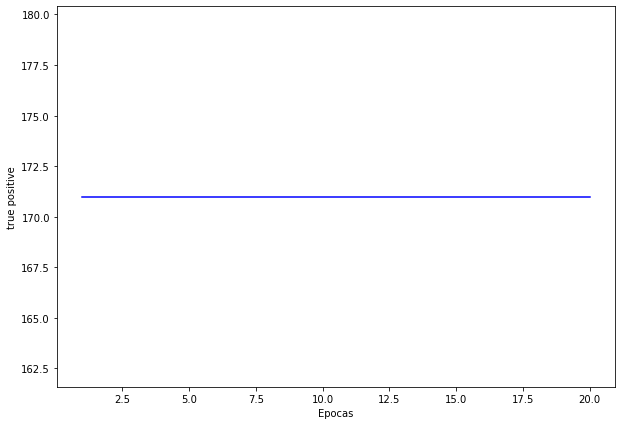

In [68]:
graficar(medidas_train, 'true positive', 'blue')

**True Negatives:**

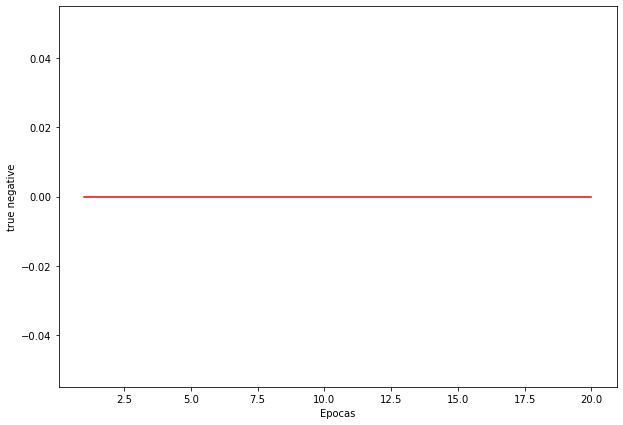

In [69]:
graficar(medidas_train, 'true negative', 'red')

**False Positives:**

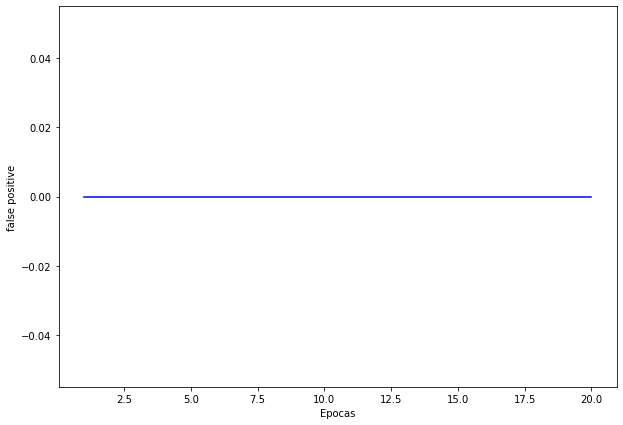

In [70]:
graficar(medidas_train, 'false positive', 'blue')

**False Negatives:**

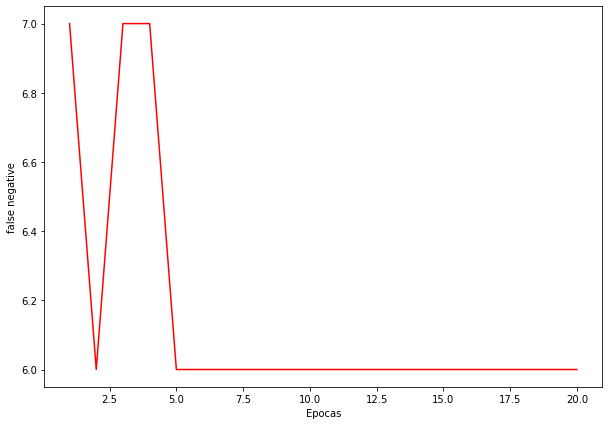

In [71]:
graficar(medidas_train, 'false negative', 'red')

**Precision:**

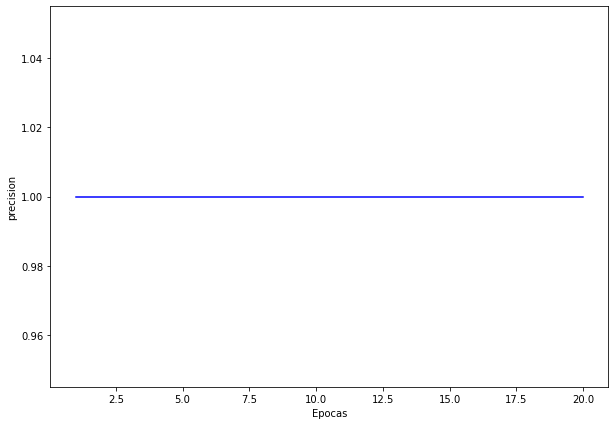

In [72]:
graficar(medidas_train, 'precision', 'blue')

**Recall:**

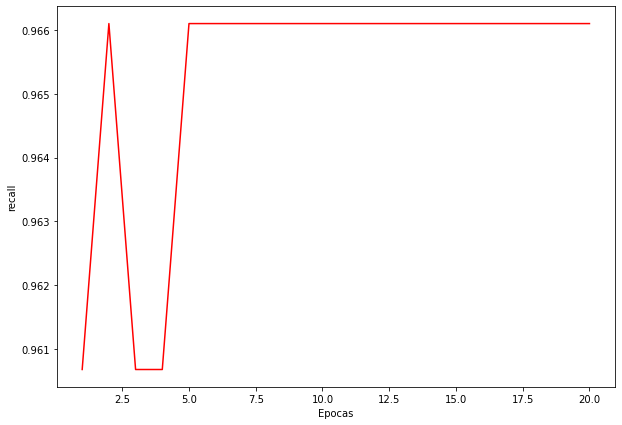

In [73]:
graficar(medidas_train, 'recall', 'red')

**Medida f1:**

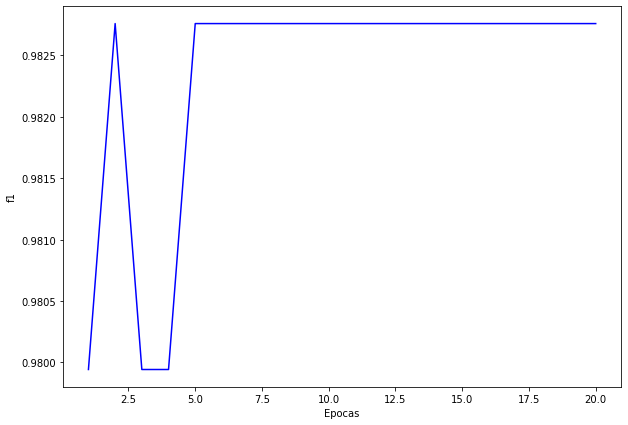

In [74]:
graficar(medidas_train, 'f1', 'blue')

$ \underline{Comentarios:} \ $ En los gráficos se puede observar que:

- Las **True Positives (TP)** después de la primera iteración se mantienen en el máximo mayor posible.

- Las **True Negatives (TN)** siempre se mantendrán en el valor 0 como se comenta por enunciado. 

- Las **False Positives (FP)** después de la primera iteración se mentienen constante en el valor 0.

- Las **False Negatives (FN)** son los que más varían, algunas veces disminuyen y otras veces aumenta, manteniendose constante después en un número de 6. 

- La **precisión** después de la primera etapa se mantiene constante en el valor de 1.

- El **recall** es una medida que varía, pero luego se mantiene constante en un valor de 0,966.

- La medida **f1** que combina **precision y recall** también varía, pero luego de una cantidad de iteraciones se mantiene en un valor constante de 0.9825.

De esta manera, podemos decir que el modelo se ajusto rapidamente de buena manera sobre el **Train set** que era lo que se esperaba. $ \ $

**Graficos de muestra**

Ahora probaremos nuestra red neuronal en imagenes de mapache que no estan ni el 'test set' ni el 'training set' y mostraremos los resultados graficamente. 

In [57]:
def retornar_bounding_box_score(imagen, modelo, umbral):
  img = np.array(imagen)
  img = ToTensor()(img)
  img = img.cuda()

  model.eval()
  out = model([img])

  bounding_boxes = []
  scores = []

  for i in range(len(out[0]['scores'])):
    if float(out[0]['scores'][i]) >= umbral:
      scores.append(float(out[0]['scores'][i]))
      bounding_boxes.append(out[0]['boxes'][i].tolist())

  producto = [bounding_boxes, scores]

  return producto

In [58]:
def graficar_bounding_boxes(imagen, modelo, umbral):
  out = retornar_bounding_box_score(imagen, modelo, umbral)

  fig, ax = plt.subplots(figsize = (10, 10))

  ax.imshow(imagen)

  for i in range(len(out[0])):
    box = out[0][i]
    x,y,w,h = box
    w = w-x
    h = h-y

    # Create a Rectangle patch
    rect = patches.Rectangle((x, y-10), w, h, linewidth=1, edgecolor='r', facecolor='none')

    # Add the patch to the Axes
    ax.add_patch(rect)

    # Add text
    texto = "Racoon. " + str(round(out[1][i], 2)) + "."

    ax.text(x, y, texto, fontsize = 8, color = 'black', backgroundcolor = 'white')

  plt.show()

**Imagen 1:**

In [59]:
imagen_1 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/Raccoon_dataset/ImagenesPrueba/rocketfighting.jpg')

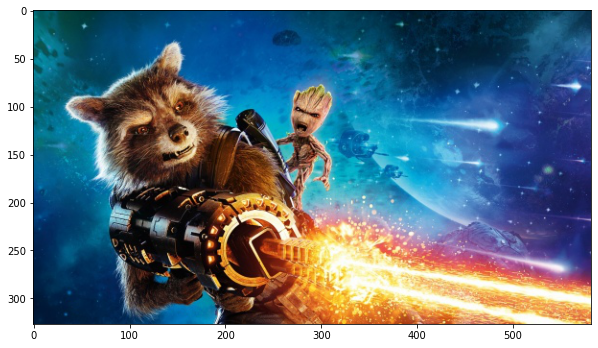

In [60]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_1)
plt.show()

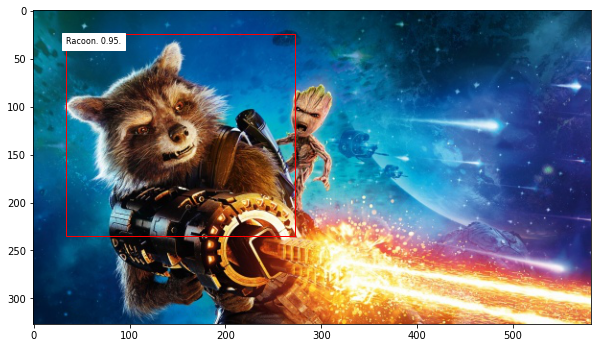

In [61]:
graficar_bounding_boxes(imagen_1, model, 0.85)

**Imagen 2:**

In [62]:
imagen_2 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/Raccoon_dataset/ImagenesPrueba/rocketraccoon.jpg')

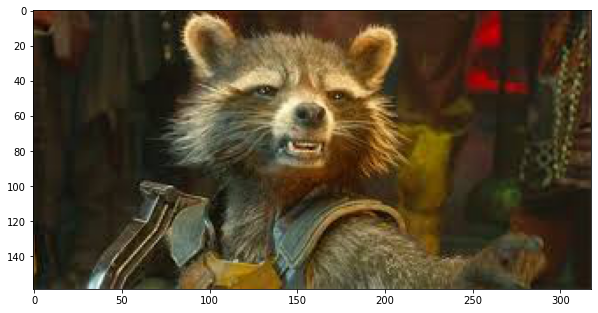

In [63]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_2)
plt.show()

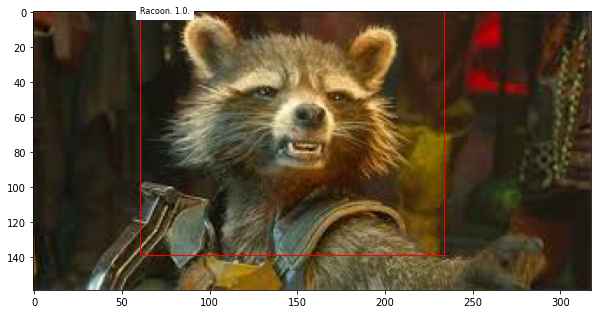

In [64]:
graficar_bounding_boxes(imagen_2, model, 0.85)

**Imagen 3:**

In [65]:
imagen_3 = Image.open('drive/MyDrive/DeepLearningUC/Tarea1/Parte3/Actividad12/Raccoon_dataset/ImagenesPrueba/tworaccons.jpg')

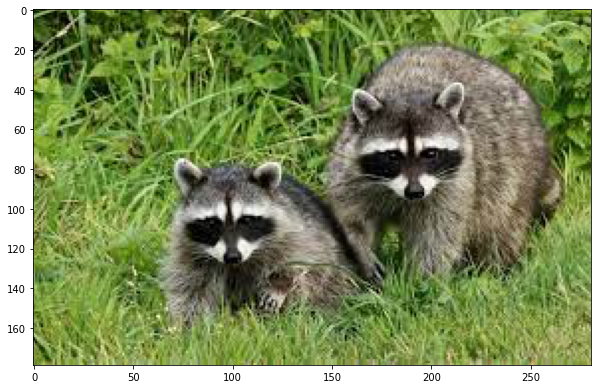

In [66]:
fig, ax = plt.subplots(figsize = (10, 10))
ax.imshow(imagen_3)
plt.show()

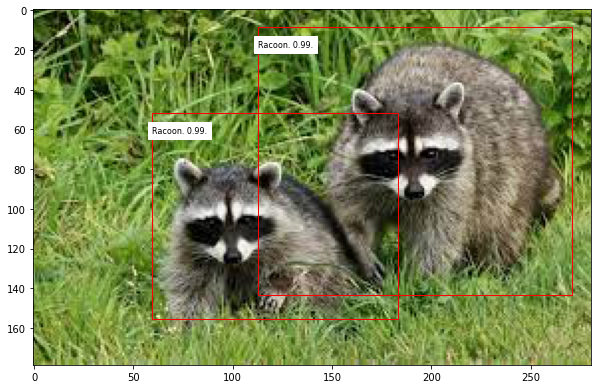

In [67]:
graficar_bounding_boxes(imagen_3, model, 0.95)

$ \underline{Comentarios}: $ A través de esta demostración tenemos otra prueba de que nuestro modelo quedo bien entrenado, pues utilizamos imagenes de internet aleatorias y revisamos si la red identificaba bien mapaches. De hecho, pusimos una imagen con 2 mapaches y las otras dos imagenes corresponden a un mapache de una pelicula el cual también lo detecto.

$ \huge \underline{Referencias} $

$ \ $ 

**[1]** https://colab.research.google.com/drive/1uPQVB0gJEFVhKQ42gNwhJPXS7FCr9ZAv?usp=sharing

(Notebook del ayudante para la actividad 8)

$ \ $ 

**[2]** https://towardsdatascience.com/non-maximum-suppression-nms-93ce178e177c

(Página para responder las preguntas teorícas de la actividad 10)

$ \ $

**[3]** https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html

(Tutorial para la realización de la actividad 12)

$ \ $ 

**[4]** https://towardsdatascience.com/evaluating-performance-of-an-object-detection-model-137a349c517b

(Página que nos dice como calcular las medidas de desempeño en el contexto de anchor boxes)



